<a href="https://colab.research.google.com/github/barish-bit/Time_Series_Forecasting_and_Error_Analysis_for_Climate_Data/blob/main/Basic_time_series_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data set preparation

Converting net_cdf file in csv file

In [ ]:
pip install netCDF4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 39.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 78.5 MB/s eta 0:00:00


In [ ]:
from netCDF4 import Dataset
import numpy as np
import csv
import xarray as xr

In [ ]:
data=Dataset(r"/content/drive/MyDrive/Maharashtra_Nagpur_station.nc")
print(data)

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    title: Maharashtra_Nagpur
    source: HadISD data product
    distance_from_nearest_coast: 357.2931336069998
    elevation: 314.9
    units: station_pressure in pascals,        dry bulb temperature in degC,        wet bulb temperature in degC,        dewpoint temperaturein degC,        distance in kilometers
    coordinates: latitude longitude lon lat elevation
    dimensions(sizes): time(127834), coordinate_length(1)
    variables(dimensions): float64 time(time), float64 dry_bulb_temperature(time), float64 dew_point_temperature(time), float64 station_pressure(time), float64 wet_bulb_temperature(time), float64 specific_humidity(time), float64 longitude(coordinate_length), float64 latitude(coordinate_length), float64 elevation(coordinate_length), float64 lat(coordinate_length), float64 lon(coordinate_length)
    groups: 


Understanding the dataset

In [ ]:
temp=data.variables["dry_bulb_temperature"][:]
#print(temp)
print("no of dataset:",len(temp))


no of dataset: 127834


In [ ]:
longitudes=data.variables["longitude"][:]
print("longitude:",longitudes)
#print(len(longitudes))

time=data.variables["time"][:]
#print(time)
#print(len(time))

latitudes=data.variables["latitude"][:]
print("latitude:",latitudes)
#print(len(latitudes))

data.close()

ds = xr.open_mfdataset(['/content/drive/MyDrive/Maharashtra_Nagpur_station.nc'])
ds = ds.sortby('time')
df = ds['dry_bulb_temperature'].to_dataframe()
df.to_csv('output.csv')

longitude: [79.047]
latitude: [21.092]


In [ ]:
import pandas as pd
import csv

csv_file = "/content/output.csv"
num_rows = 0
num_columns = 0

with open(csv_file, 'r') as csvfile:
    csvreader = csv.reader(csvfile)
    for row in csvreader:
        num_rows += 1
        if num_rows == 1:
            num_columns = len(row)

print(f"Number of rows: {num_rows}")
print(f"Number of columns: {num_columns}")

file=pd.read_csv("/content/output.csv")
file.head()

Number of rows: 127835
Number of columns: 2


,time,dry_bulb_temperature
0,1944-01-01 03:00:00,14.4
1,1944-01-01 12:00:00,27.2
2,1944-01-02 03:00:00,14.4
3,1944-01-02 12:00:00,26.7
4,1944-01-03 03:00:00,14.4


Converting into daily average

In [ ]:
from datetime import date, timedelta


start_date = date(1994, 1, 1)
end_date = date(2020, 3, 26)
delta = timedelta(days=1)
dates = []
current_date = start_date

while current_date <= end_date:
        dates.append(current_date)
        current_date += delta
dates = [date.strftime('%Y-%m-%d') for date in dates]
print(dates)
print(len(dates))

['1994-01-01', '1994-01-02', '1994-01-03', '1994-01-04', '1994-01-05', '1994-01-06', '1994-01-07', '1994-01-08', '1994-01-09', '1994-01-10', '1994-01-11', '1994-01-12', '1994-01-13', '1994-01-14', '1994-01-15', '1994-01-16', '1994-01-17', '1994-01-18', '1994-01-19', '1994-01-20', '1994-01-21', '1994-01-22', '1994-01-23', '1994-01-24', '1994-01-25', '1994-01-26', '1994-01-27', '1994-01-28', '1994-01-29', '1994-01-30', '1994-01-31', '1994-02-01', '1994-02-02', '1994-02-03', '1994-02-04', '1994-02-05', '1994-02-06', '1994-02-07', '1994-02-08', '1994-02-09', '1994-02-10', '1994-02-11', '1994-02-12', '1994-02-13', '1994-02-14', '1994-02-15', '1994-02-16', '1994-02-17', '1994-02-18', '1994-02-19', '1994-02-20', '1994-02-21', '1994-02-22', '1994-02-23', '1994-02-24', '1994-02-25', '1994-02-26', '1994-02-27', '1994-02-28', '1994-03-01', '1994-03-02', '1994-03-03', '1994-03-04', '1994-03-05', '1994-03-06', '1994-03-07', '1994-03-08', '1994-03-09', '1994-03-10', '1994-03-11', '1994-03-12', '1994

In [ ]:
time=file.time.tolist()
temp=file.dry_bulb_temperature.tolist()
index=time.index('1994-01-01 00:00:00')
time=time[int(index):]
temp=temp[int(index):]
time1=time
print(time)
print(temp)
print(len(time))
print(len(temp))

['1994-01-01 00:00:00', '1994-01-01 03:00:00', '1994-01-01 06:00:00', '1994-01-01 15:00:00', '1994-01-01 18:00:00', '1994-01-02 00:00:00', '1994-01-02 03:00:00', '1994-01-02 06:00:00', '1994-01-02 09:00:00', '1994-01-02 12:00:00', '1994-01-02 15:00:00', '1994-01-02 18:00:00', '1994-01-02 21:00:00', '1994-01-03 00:00:00', '1994-01-03 03:00:00', '1994-01-03 06:00:00', '1994-01-03 09:00:00', '1994-01-03 12:00:00', '1994-01-03 15:00:00', '1994-01-03 18:00:00', '1994-01-03 21:00:00', '1994-01-04 00:00:00', '1994-01-04 03:00:00', '1994-01-04 06:00:00', '1994-01-04 09:00:00', '1994-01-04 12:00:00', '1994-01-04 15:00:00', '1994-01-04 21:00:00', '1994-01-05 00:00:00', '1994-01-05 03:00:00', '1994-01-05 06:00:00', '1994-01-05 12:00:00', '1994-01-05 15:00:00', '1994-01-05 18:00:00', '1994-01-05 21:00:00', '1994-01-06 00:00:00', '1994-01-06 03:00:00', '1994-01-06 06:00:00', '1994-01-06 09:00:00', '1994-01-06 15:00:00', '1994-01-06 18:00:00', '1994-01-06 21:00:00', '1994-01-07 03:00:00', '1994-01-0

In [ ]:
from datetime import datetime, timedelta

start_date = date(1994, 1, 1)
end_date = date(2020, 3, 26)
delta = timedelta(days=1)
times = ["00:00:00", "03:00:00", "06:00:00", "09:00:00", "12:00:00", "15:00:00", "18:00:00", "21:00:00"]
datetime_list = []

current_date = start_date

while current_date <= end_date:
    for time in times:
        datetime_str = f"{current_date} {time}"
        datetime_obj = datetime.strptime(datetime_str, "%Y-%m-%d %H:%M:%S")
        datetime_list.append(datetime_obj)
    current_date += delta

formatted_dates = [datetime.strftime('%Y-%m-%d %H:%M:%S') for datetime in datetime_list]
print(formatted_dates)

['1994-01-01 00:00:00', '1994-01-01 03:00:00', '1994-01-01 06:00:00', '1994-01-01 09:00:00', '1994-01-01 12:00:00', '1994-01-01 15:00:00', '1994-01-01 18:00:00', '1994-01-01 21:00:00', '1994-01-02 00:00:00', '1994-01-02 03:00:00', '1994-01-02 06:00:00', '1994-01-02 09:00:00', '1994-01-02 12:00:00', '1994-01-02 15:00:00', '1994-01-02 18:00:00', '1994-01-02 21:00:00', '1994-01-03 00:00:00', '1994-01-03 03:00:00', '1994-01-03 06:00:00', '1994-01-03 09:00:00', '1994-01-03 12:00:00', '1994-01-03 15:00:00', '1994-01-03 18:00:00', '1994-01-03 21:00:00', '1994-01-04 00:00:00', '1994-01-04 03:00:00', '1994-01-04 06:00:00', '1994-01-04 09:00:00', '1994-01-04 12:00:00', '1994-01-04 15:00:00', '1994-01-04 18:00:00', '1994-01-04 21:00:00', '1994-01-05 00:00:00', '1994-01-05 03:00:00', '1994-01-05 06:00:00', '1994-01-05 09:00:00', '1994-01-05 12:00:00', '1994-01-05 15:00:00', '1994-01-05 18:00:00', '1994-01-05 21:00:00', '1994-01-06 00:00:00', '1994-01-06 03:00:00', '1994-01-06 06:00:00', '1994-01-0

In [ ]:
print(formatted_dates[0])
print(time1[0])
print(time1)
if formatted_dates[0]==time1[0]:
  print("true")
else:
  print("false")

1994-01-01 00:00:00
1994-01-01 00:00:00
['1994-01-01 00:00:00', '1994-01-01 03:00:00', '1994-01-01 06:00:00', '1994-01-01 15:00:00', '1994-01-01 18:00:00', '1994-01-02 00:00:00', '1994-01-02 03:00:00', '1994-01-02 06:00:00', '1994-01-02 09:00:00', '1994-01-02 12:00:00', '1994-01-02 15:00:00', '1994-01-02 18:00:00', '1994-01-02 21:00:00', '1994-01-03 00:00:00', '1994-01-03 03:00:00', '1994-01-03 06:00:00', '1994-01-03 09:00:00', '1994-01-03 12:00:00', '1994-01-03 15:00:00', '1994-01-03 18:00:00', '1994-01-03 21:00:00', '1994-01-04 00:00:00', '1994-01-04 03:00:00', '1994-01-04 06:00:00', '1994-01-04 09:00:00', '1994-01-04 12:00:00', '1994-01-04 15:00:00', '1994-01-04 21:00:00', '1994-01-05 00:00:00', '1994-01-05 03:00:00', '1994-01-05 06:00:00', '1994-01-05 12:00:00', '1994-01-05 15:00:00', '1994-01-05 18:00:00', '1994-01-05 21:00:00', '1994-01-06 00:00:00', '1994-01-06 03:00:00', '1994-01-06 06:00:00', '1994-01-06 09:00:00', '1994-01-06 15:00:00', '1994-01-06 18:00:00', '1994-01-06 21:0

In [ ]:
# List with dates and corresponding values (some dates are missing)
dates_with_values = time1
values = temp

all_dates =formatted_dates
date_value_dict = {date: value for date, value in zip(dates_with_values, values)}
result_list = [[date, date_value_dict.get(date, "")] for date in all_dates]

print(result_list)


[['1994-01-01 00:00:00', 13.0], ['1994-01-01 03:00:00', 16.19999999999999], ['1994-01-01 06:00:00', 24.80000000000001], ['1994-01-01 09:00:00', ''], ['1994-01-01 12:00:00', ''], ['1994-01-01 15:00:00', 19.0], ['1994-01-01 18:00:00', 15.800000000000011], ['1994-01-01 21:00:00', ''], ['1994-01-02 00:00:00', 13.800000000000011], ['1994-01-02 03:00:00', 15.399999999999975], ['1994-01-02 06:00:00', 25.600000000000023], ['1994-01-02 09:00:00', 27.0], ['1994-01-02 12:00:00', 25.0], ['1994-01-02 15:00:00', 19.19999999999999], ['1994-01-02 18:00:00', 16.399999999999977], ['1994-01-02 21:00:00', 14.600000000000025], ['1994-01-03 00:00:00', 13.0], ['1994-01-03 03:00:00', 16.0], ['1994-01-03 06:00:00', 25.399999999999977], ['1994-01-03 09:00:00', 28.600000000000023], ['1994-01-03 12:00:00', 25.600000000000023], ['1994-01-03 15:00:00', 20.399999999999977], ['1994-01-03 18:00:00', 17.399999999999977], ['1994-01-03 21:00:00', 18.399999999999977], ['1994-01-04 00:00:00', 15.399999999999975], ['1994-01

In [ ]:
print((result_list[1]))
print(len(formatted_dates))
from collections import Counter

my_list=[]
for i in range (len(result_list)):
  my_list.append(result_list[i][0])

print(my_list)
print(len(my_list))


element_counts = Counter(my_list)
duplicates = [element for element, count in element_counts.items() if count > 1]

if duplicates:
    print("Duplicate element(s):", duplicates)
else:
    print("No duplicate elements found.")


['1994-01-01 03:00:00', 16.19999999999999]
76656
['1994-01-01 00:00:00', '1994-01-01 03:00:00', '1994-01-01 06:00:00', '1994-01-01 09:00:00', '1994-01-01 12:00:00', '1994-01-01 15:00:00', '1994-01-01 18:00:00', '1994-01-01 21:00:00', '1994-01-02 00:00:00', '1994-01-02 03:00:00', '1994-01-02 06:00:00', '1994-01-02 09:00:00', '1994-01-02 12:00:00', '1994-01-02 15:00:00', '1994-01-02 18:00:00', '1994-01-02 21:00:00', '1994-01-03 00:00:00', '1994-01-03 03:00:00', '1994-01-03 06:00:00', '1994-01-03 09:00:00', '1994-01-03 12:00:00', '1994-01-03 15:00:00', '1994-01-03 18:00:00', '1994-01-03 21:00:00', '1994-01-04 00:00:00', '1994-01-04 03:00:00', '1994-01-04 06:00:00', '1994-01-04 09:00:00', '1994-01-04 12:00:00', '1994-01-04 15:00:00', '1994-01-04 18:00:00', '1994-01-04 21:00:00', '1994-01-05 00:00:00', '1994-01-05 03:00:00', '1994-01-05 06:00:00', '1994-01-05 09:00:00', '1994-01-05 12:00:00', '1994-01-05 15:00:00', '1994-01-05 18:00:00', '1994-01-05 21:00:00', '1994-01-06 00:00:00', '1994-0

In [ ]:
import csv

result_list.insert(0, ["Dates","Temp"])
data =result_list
csv_file_path = "/content/output2.csv"


with open(csv_file_path, "w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {csv_file_path}")



Data has been written to /content/output2.csv


In [ ]:
import pandas as pd
df=pd.read_csv("/content/output2.csv")
df.head(20)

,Dates,Temp
0,1994-01-01 00:00:00,13.0
1,1994-01-01 03:00:00,16.2
2,1994-01-01 06:00:00,24.8
3,1994-01-01 09:00:00,NaN
4,1994-01-01 12:00:00,NaN
5,1994-01-01 15:00:00,19.0
6,1994-01-01 18:00:00,15.8
7,1994-01-01 21:00:00,NaN
8,1994-01-02 00:00:00,13.8
9,1994-01-02 03:00:00,15.4


In [ ]:
#Interpolate for the missing values
df1=df.interpolate()
df1.head(20)

,Dates,Temp
0,1994-01-01 00:00:00,13.000000
1,1994-01-01 03:00:00,16.200000
2,1994-01-01 06:00:00,24.800000
3,1994-01-01 09:00:00,22.866667
4,1994-01-01 12:00:00,20.933333
5,1994-01-01 15:00:00,19.000000
6,1994-01-01 18:00:00,15.800000
7,1994-01-01 21:00:00,14.800000
8,1994-01-02 00:00:00,13.800000
9,1994-01-02 03:00:00,15.400000


In [ ]:
df1.tail()

,Dates,Temp
76651,2020-03-26 09:00:00,24.668966
76652,2020-03-26 12:00:00,24.934483
76653,2020-03-26 15:00:00,25.200000
76654,2020-03-26 18:00:00,25.200000
76655,2020-03-26 21:00:00,25.200000


In [ ]:
temp_list=[]
#time=df1["Dates"]
temp=df1["Temp"]
#for i in range (len(dates)):
c=int((len(temp))/8)
print(c)
for j in range (c):
    temp_list.append(np.mean(temp[j*8:(j+1)*8]))
print(len(temp_list))

print(len(dates))


9582
9582
9582


In [ ]:
print(temp_list)

[18.425000000000004, 19.625, 20.599999999999994, 20.76249999999999, 20.174999999999986, 20.1875, 20.612500000000004, 20.487499999999997, 20.86250000000001, 19.5875, 21.975000000000005, 21.912499999999994, 23.19999999999999, 21.300000000000004, 21.250000000000018, 16.2125, 16.562500000000004, 18.9, 18.6625, 19.375, 19.975000000000016, 21.875, 23.0375, 24.050000000000004, 24.149999999999988, 23.800000000000004, 23.012499999999996, 22.625000000000004, 22.6, 22.037499999999998, 19.40000000000001, 19.549999999999997, 18.525000000000006, 18.35, 19.674999999999997, 20.100000000000005, 20.75, 23.34999999999999, 23.58749999999999, 21.700000000000003, 20.754166666666677, 22.833333333333336, 21.337500000000002, 22.2875, 21.39999999999999, 23.250000000000004, 23.58125, 23.725, 24.325000000000003, 23.874999999999993, 26.59999999999999, 25.174999999999994, 21.25, 20.66250000000001, 22.51250000000001, 22.593749999999993, 23.300000000000008, 23.412499999999987, 22.700000000000006, 24.275000000000006, 

In [ ]:
import csv
dates=dates[:-730]
temp_list=temp_list[:-730]

csv_file = "final_output2.csv"
with open(csv_file, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)

    # Write header
    csvwriter.writerow(['Dates', 'Mean_temp'])

    # Write data
    for item1, item2 in zip(dates, temp_list):
        csvwriter.writerow([item1, item2])

Visualizing the csv file with average data

In [ ]:
import pandas as pd
import csv

csv_file = "/content/final_output2.csv"
num_rows = 0
num_columns = 0

with open(csv_file, 'r') as csvfile:
    csvreader = csv.reader(csvfile)
    for row in csvreader:
        num_rows += 1
        if num_rows == 1:
            num_columns = len(row)

print(f"Number of rows: {num_rows}")
print(f"Number of columns: {num_columns}")



file1=pd.read_csv("/content/final_output2.csv")
file1.head()

Number of rows: 8853
Number of columns: 2


,Dates,Mean_temp
0,1994-01-01,18.4250
1,1994-01-02,19.6250
2,1994-01-03,20.6000
3,1994-01-04,20.7625
4,1994-01-05,20.1750


<ipython-input-21-a9133c19e83b>:4: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


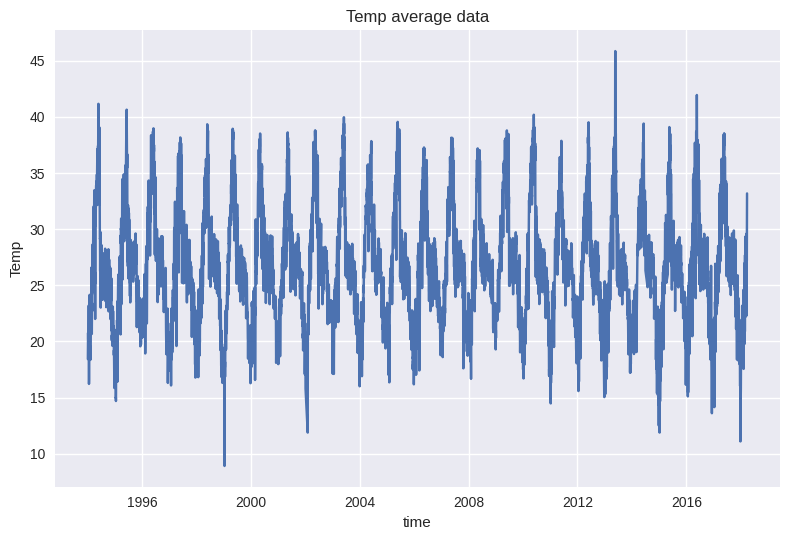

In [ ]:
from matplotlib import dates as mpl_dates
import matplotlib.pyplot as plt

plt.style.use('seaborn')

data = pd.read_csv('/content/final_output2.csv')

data['Dates'] = pd.to_datetime(data['Dates'])
data.sort_values('Dates', inplace=True)

time_data = data['Dates']
mean_data = data['Mean_temp']

plt.plot(time_data, mean_data, linestyle='solid')

#plt.gcf().autofmt_xdate()

plt.title('Temp average data')
plt.xlabel('time')
plt.ylabel('Temp')

plt.tight_layout()

<ipython-input-22-5f4626bdd164>:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


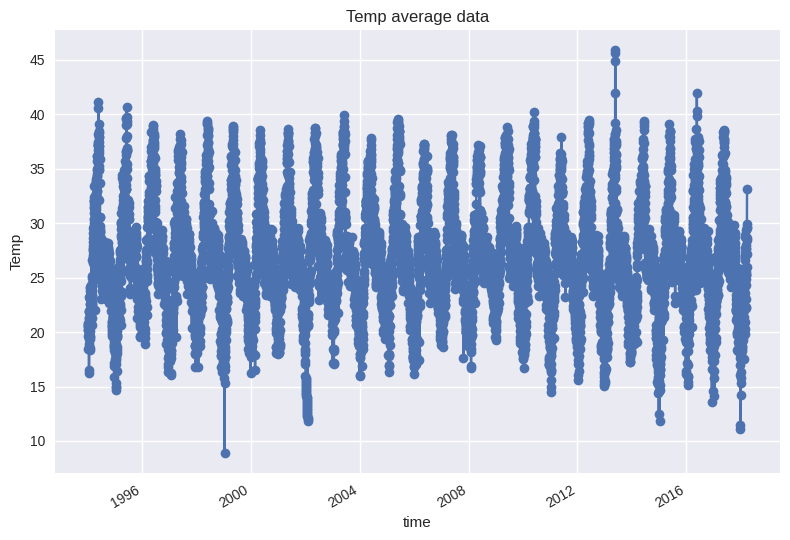

In [ ]:
plt.style.use('seaborn')

data = pd.read_csv('/content/final_output2.csv')

data['Dates'] = pd.to_datetime(data['Dates'])
data.sort_values('Dates', inplace=True)

time_data = data['Dates']
mean_data = data['Mean_temp']

plt.plot_date(time_data, mean_data, linestyle='solid')

plt.gcf().autofmt_xdate()

plt.title('Temp average data')
plt.xlabel('time')
plt.ylabel('Temp')

plt.tight_layout()

In [ ]:
data.describe()

,Mean_temp
count,8852.000000
mean,26.639762
std,5.035605
min,8.900000
25%,23.150000
50%,26.500000
75%,29.213542
max,45.870956


Some pre-processing

In [ ]:
import pandas as pd
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [ ]:
df=pd.read_csv('/content/final_output2.csv',
index_col="Dates",
parse_dates=True)
df.head()

,Mean_temp
Dates,
1994-01-01,18.4250
1994-01-02,19.6250
1994-01-03,20.6000
1994-01-04,20.7625
1994-01-05,20.1750


In [ ]:
df=df.asfreq("D")
df.index

DatetimeIndex(['1994-01-01', '1994-01-02', '1994-01-03', '1994-01-04',
               '1994-01-05', '1994-01-06', '1994-01-07', '1994-01-08',
               '1994-01-09', '1994-01-10',
               ...
               '2018-03-18', '2018-03-19', '2018-03-20', '2018-03-21',
               '2018-03-22', '2018-03-23', '2018-03-24', '2018-03-25',
               '2018-03-26', '2018-03-27'],
              dtype='datetime64[ns]', name='Dates', length=8852, freq='D')

<Axes: xlabel='Dates'>

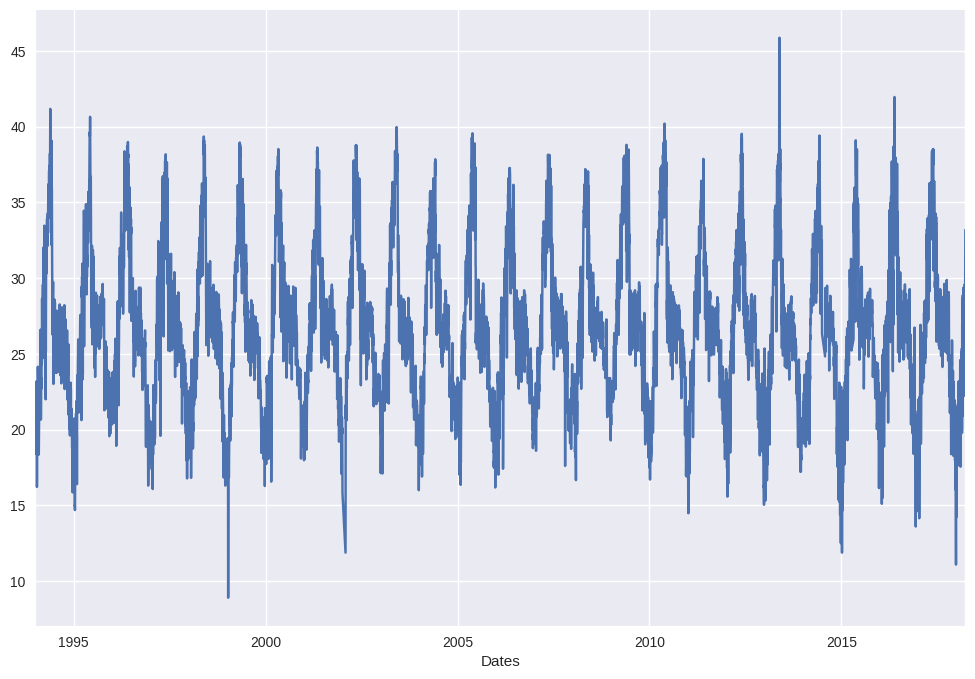

In [ ]:
df["Mean_temp"].plot(figsize=(12,8))

In [ ]:
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose


In [ ]:
df.isnull().sum()


Mean_temp    0
dtype: int64

In [ ]:
df1=df.interpolate()

In [ ]:
df1.tail()

,Mean_temp
Dates,
2018-03-23,28.606250
2018-03-24,27.200000
2018-03-25,29.575000
2018-03-26,29.950000
2018-03-27,33.185417


In [ ]:
df1.isnull().sum()

Mean_temp    0
dtype: int64

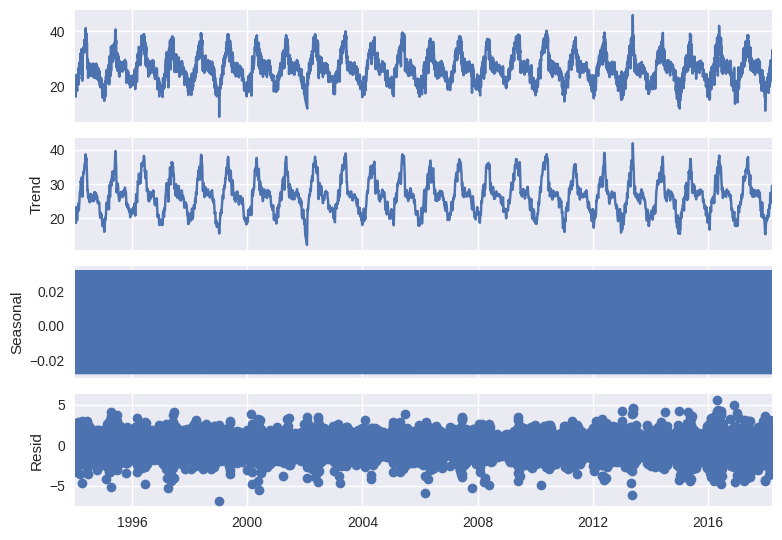

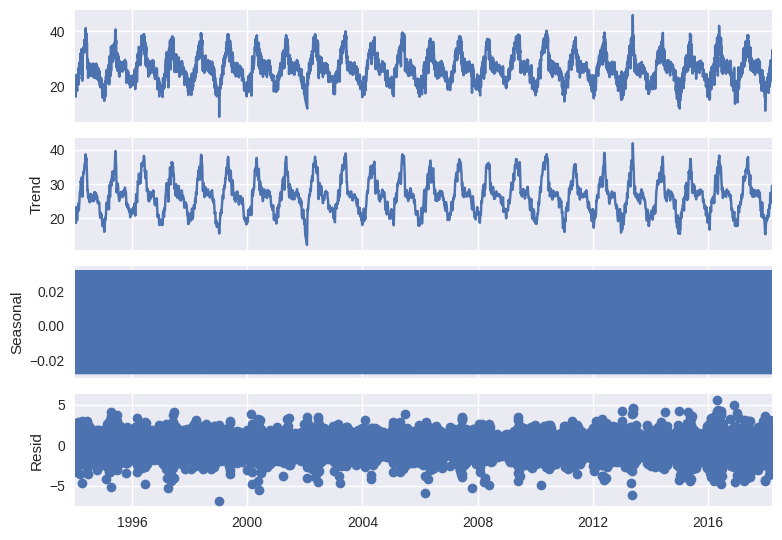

In [ ]:
seasonal_decompose(df1,model="additive").plot()

In [ ]:
#model=ExponentialSmoothing(endog=df.Mean_temp).fit()

Different type of Errors

In [ ]:
print(len(df1["Mean_temp"]))

8852


In [ ]:
lists=[]
for i in range (8):
  lists.append([])

lists1=[]
for i in range (8):
  lists1.append([])
for j in range (8):
  for i in range (int((len(df1["Mean_temp"])/8))):

      lists[j].append(df1["Mean_temp"][i*8])

print(lists)





[[18.425000000000004, 20.86250000000001, 16.562500000000004, 24.149999999999988, 18.52500000000001, 20.75416666666668, 24.325000000000003, 23.300000000000008, 28.63750000000001, 29.575, 30.000000000000007, 32.025000000000006, 26.625000000000004, 30.6625, 33.825, 33.412499999999994, 33.98125, 37.225, 36.45625, 35.0, 30.579166666666666, 29.4875, 26.55, 25.000000000000007, 23.750000000000004, 23.9875, 26.874999999999996, 26.125, 27.1625, 28.262499999999992, 25.262500000000006, 24.131249999999994, 27.275, 25.749999999999996, 27.15000000000001, 25.975, 26.362500000000004, 23.96250000000001, 23.95, 23.9625, 22.099999999999994, 19.8625, 20.899999999999995, 21.375, 18.66250000000001, 18.04999999999999, 20.22500000000001, 15.000000000000009, 18.700000000000003, 21.89375, 21.987499999999997, 25.95, 23.33749999999999, 24.775, 23.3375, 22.008333333333333, 25.750000000000004, 28.625, 25.5, 32.175, 34.3125, 28.925000000000004, 30.7625, 34.65, 36.275, 39.75000000000001, 36.6875, 26.9, 28.262500000000

In [ ]:
print(len(lists[0]))

1106


In [ ]:
if lists[0]==lists[1]:
  print("true")

true


In [ ]:
print(len(lists))
mean_list=[]
for i in range (len(lists)):
  mean_list.append(np.mean(lists[i]))
print(mean_list)


8
[26.62296833371158, 26.62296833371158, 26.62296833371158, 26.62296833371158, 26.62296833371158, 26.62296833371158, 26.62296833371158, 26.62296833371158]


# Regression model

# Simple linear regression with only one variable


In [ ]:
import pandas as pd
df1=pd.read_csv("/content/final_output2.csv")

In [ ]:
from sklearn.linear_model import LinearRegression

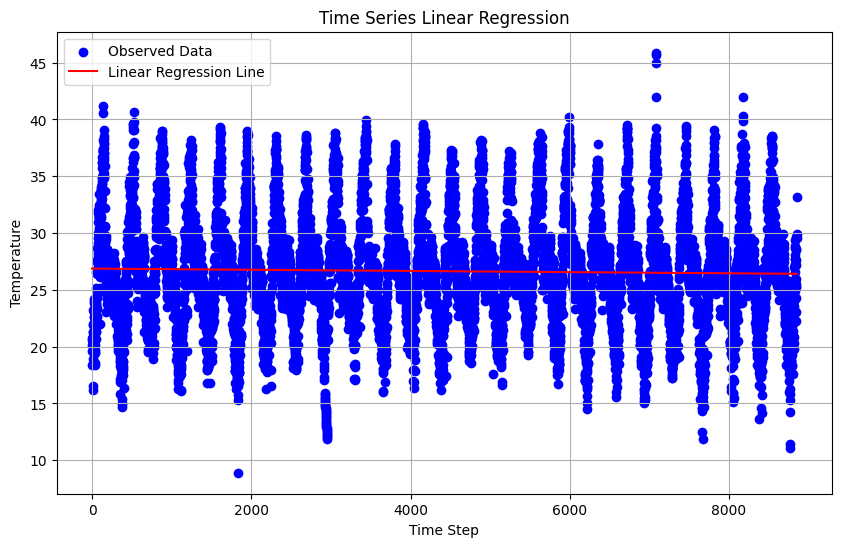

Intercept: 26.867854008659464
Slope (Coefficient): -5.1540400718234614e-05


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

time_steps = np.arange(0, len(df1['Mean_temp']))
X = time_steps.reshape(-1, 1)
y=df1['Mean_temp'].tolist()

model = LinearRegression()
model.fit(X, y)

intercept = model.intercept_
slope = model.coef_[0]

predictions = model.predict(X)

plt.figure(figsize=(10, 6))
plt.scatter(X, y, label='Observed Data', color='blue')
plt.plot(X, predictions, label='Linear Regression Line', color='red')
plt.xlabel('Time Step')
plt.ylabel('Temperature')
plt.title('Time Series Linear Regression')
plt.legend()
plt.grid(True)
plt.show()

print(f'Intercept: {intercept}')
print(f'Slope (Coefficient): {slope}')

# Linear regression with 3 variables

In [ ]:
df1['LastYear']=df1['Mean_temp'].shift(+365)
df1['2LastYear']=df1['Mean_temp'].shift(+730)
df1['3LastYear']=df1['Mean_temp'].shift(+1095)
df1

,Dates,Mean_temp,LastYear,2LastYear,3LastYear
0,1994-01-01,18.425000,NaN,NaN,NaN
1,1994-01-02,19.625000,NaN,NaN,NaN
2,1994-01-03,20.600000,NaN,NaN,NaN
3,1994-01-04,20.762500,NaN,NaN,NaN
4,1994-01-05,20.175000,NaN,NaN,NaN
...,...,...,...,...,...
8847,2018-03-23,28.606250,32.856250,26.681250,30.225
8848,2018-03-24,27.200000,32.331250,27.187500,29.600
8849,2018-03-25,29.575000,31.990625,29.556250,29.375
8850,2018-03-26,29.950000,33.240625,29.283333,30.275


In [ ]:

df1.head()


,Dates,Mean_temp,LastYear,2LastYear,3LastYear
0,1994-01-01,18.4250,NaN,NaN,NaN
1,1994-01-02,19.6250,NaN,NaN,NaN
2,1994-01-03,20.6000,NaN,NaN,NaN
3,1994-01-04,20.7625,NaN,NaN,NaN
4,1994-01-05,20.1750,NaN,NaN,NaN


In [ ]:
df1=df1.dropna()
df1

,Dates,Mean_temp,LastYear,2LastYear,3LastYear
1095,1996-12-31,18.250000,21.125000,17.175000,18.4250
1096,1997-01-01,17.850000,20.350000,17.512500,19.6250
1097,1997-01-02,18.300000,21.050000,19.900000,20.6000
1098,1997-01-03,18.175000,20.750000,20.225000,20.7625
1099,1997-01-04,18.475000,21.725000,20.725000,20.1750
...,...,...,...,...,...
8847,2018-03-23,28.606250,32.856250,26.681250,30.2250
8848,2018-03-24,27.200000,32.331250,27.187500,29.6000
8849,2018-03-25,29.575000,31.990625,29.556250,29.3750
8850,2018-03-26,29.950000,33.240625,29.283333,30.2750


In [ ]:
lin_model=LinearRegression()

In [ ]:
import numpy as np
x1,x2,x3,y=df1['LastYear'],df1['2LastYear'],df1['3LastYear'],df1['Mean_temp']
x1,x2,x3,y=np.array(x1),np.array(x2),np.array(x3),np.array(y)
x1,x2,x3,y=x1.reshape(-1,1),x2.reshape(-1,1),x3.reshape(-1,1),y.reshape(-1,1)
final_x=np.concatenate((x1,x2,x3),axis=1)
print(final_x)

[[21.125      17.175      18.425     ]
 [20.35       17.5125     19.625     ]
 [21.05       19.9        20.6       ]
 ...
 [31.990625   29.55625    29.375     ]
 [33.240625   29.28333333 30.275     ]
 [31.21875    29.92916667 28.925     ]]


In [ ]:
X_train,X_test,y_train,y_test=final_x[:-1000],final_x[-1000:],y[:-1000],y[-1000:]

In [ ]:
print(y_train)

[[18.25 ]
 [17.85 ]
 [18.3  ]
 ...
 [29.625]
 [29.65 ]
 [27.075]]


In [ ]:
lin_model.fit(X_train,y_train)

LinearRegression()

1000


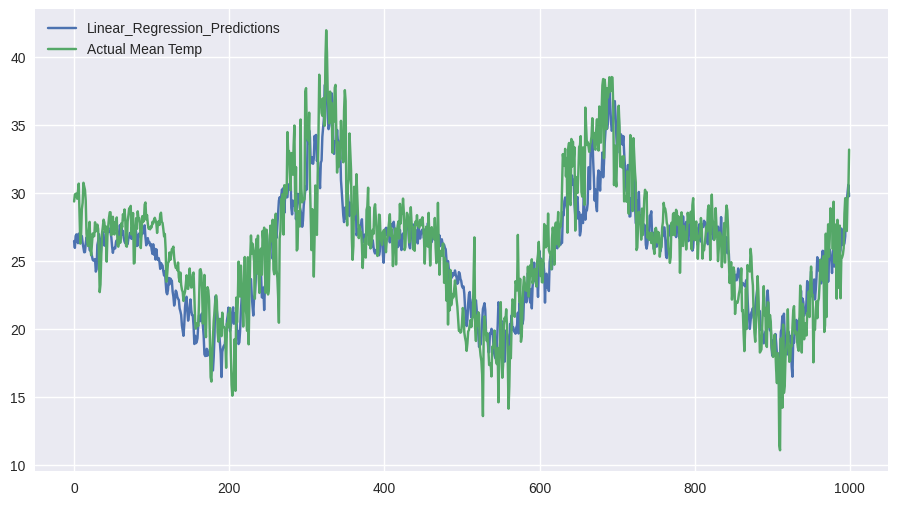

In [ ]:
lin_pred=lin_model.predict(X_test)
print(len(lin_pred))
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (11,6)
plt.plot(lin_pred,label='Linear_Regression_Predictions')
plt.plot(y_test,label='Actual Mean Temp')
plt.legend(loc="upper left")
plt.show()

In [ ]:
#print(lin_pred)

In [ ]:
coefficients = lin_model.coef_

print(f'Coefficients for predictors: {coefficients}')

intercept = lin_model.intercept_
print(f'Intercept: {intercept}')

Coefficients for predictors: [[0.3284869  0.32822953 0.2808684 ]]
Intercept: [1.56214255]


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from math import sqrt
from sklearn.metrics import r2_score

rmse_lr=sqrt(mean_squared_error(y_test,lin_pred))
mse=mean_squared_error(y_test,lin_pred)
r_squared = r2_score( y_test,lin_pred)
mae = mean_absolute_error(y_test,lin_pred)
mape = mean_absolute_percentage_error(y_test,lin_pred)

print(f"R-squared value:",r_squared)
print("MSE:",mse)
print("MAE:",mae)
print('RMSE:',rmse_lr)
print("MAPE:",mape)

R-squared value: 0.7338140505406079
MSE: 6.257527470589857
MAE: 1.9396011193445934
RMSE: 2.5015050410882362
MAPE: 0.07690624566026016


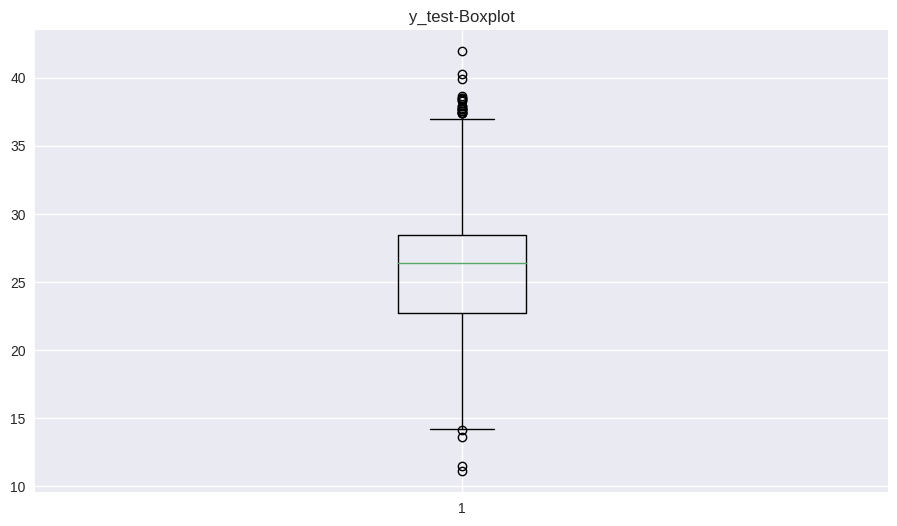

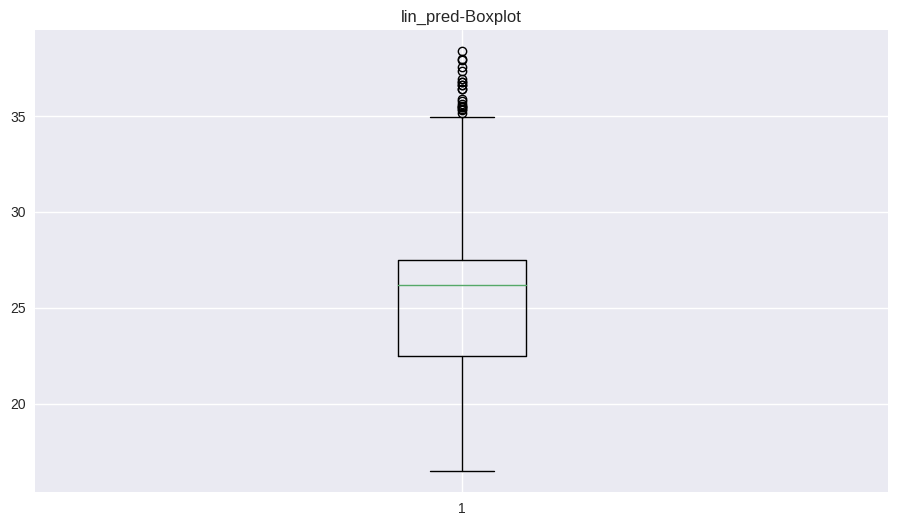

y_test,lin_pred
median 26.43020833333334 26.178098688238073
25_parcentile 22.74375 22.496910727331137
75_parcentile 28.470312500000002 27.496310365235576


In [ ]:
import matplotlib.pyplot as plt

plt.boxplot(y_test)
plt.title("y_test-Boxplot")
plt.show()

plt.boxplot(lin_pred)
plt.title("lin_pred-Boxplot")
plt.show()

print("y_test,lin_pred")
print("median",np.median(y_test), np.median(lin_pred))
print("25_parcentile",np.percentile(y_test,25), np.percentile(lin_pred,25))
print("75_parcentile",np.percentile(y_test,75), np.percentile(lin_pred,75))

In [ ]:
import pandas as pd

y_test1=[]
for i in range (len(y_test)):
  y_test1.append(y_test[i][0])

lin_pred1=[]
for i in range (len(lin_pred)):
  lin_pred1.append(lin_pred[i][0])

data = {
    'observed': y_test1,
    'lin_predicted': lin_pred1
}

df = pd.DataFrame(data)
print(df)
df.to_csv("test_output_1.csv")

#print(contingency_table)


      observed  lin_predicted
0    29.375000      26.466680
1    29.875000      25.964884
2    29.937500      26.834659
3    29.950000      26.959391
4    29.575000      26.503248
..         ...            ...
995  28.606250      29.601812
996  27.200000      29.419980
997  29.575000      30.022387
998  29.950000      30.596198
999  33.185417      29.764848

[1000 rows x 2 columns]


r2: 0.7338140505406079


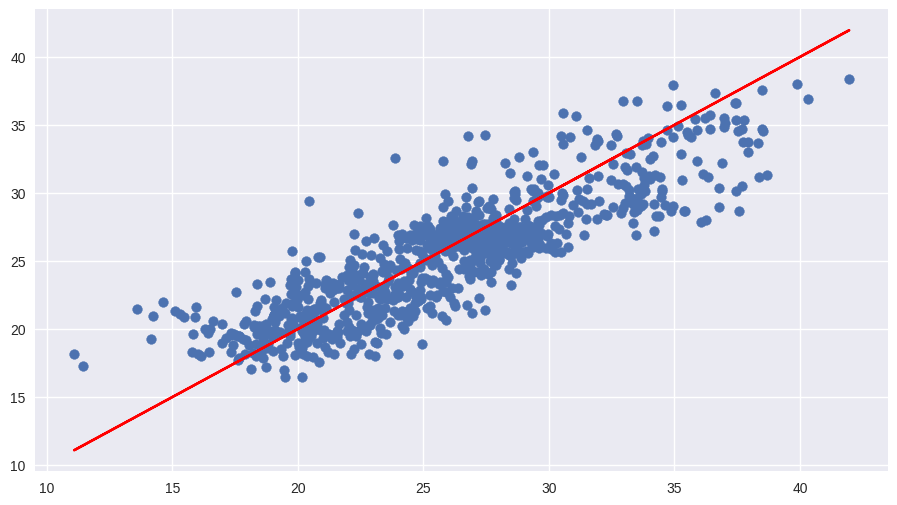

In [ ]:
print("r2:",r2_score( y_test,lin_pred))
plt.scatter(y_test1, lin_pred1)
plt.plot(y_test1,y_test1,color="r")

In [ ]:
mean_temp=np.mean(df1["Mean_temp"])
print(mean_temp)

26.632923219887413


In [ ]:


y_test_g = sum(1 for value in y_test1 if value > mean_temp)
y_test_l = sum(1 for value in y_test1 if value < mean_temp)
lin_pred_g = sum(1 for value in lin_pred1 if value > mean_temp)
lin_pred_l = sum(1 for value in lin_pred1 if value < mean_temp)

print("Number of values greater than mean temp for y test", y_test_g)


Number of values greater than mean temp for y test 485


In [ ]:
k=[]
for i in range (len(y_test1)):
  if y_test1[i]>mean_temp and lin_pred1[i]>mean_temp:
    k.append(i)
i_1=len(k)
#print(k)

j=[]
for i in range (len(y_test1)):
  if y_test1[i]<mean_temp and lin_pred1[i]<mean_temp:
    j.append(i)
i_4=len(j)

l=[]
for i in range (len(y_test1)):
  if y_test1[i]<mean_temp and lin_pred1[i]>mean_temp:
    l.append(i)
i_3=len(l)


m=[]
for i in range (len(y_test1)):
  if y_test1[i]>mean_temp and lin_pred1[i]<mean_temp:
    m.append(i)
i_2=len(m)

In [ ]:
#contingency table
from tabulate import tabulate

headers = ["Data/Forecst", "Above", "Below"]
data = [["Above", i_1,i_2 ],
        ["Below", i_3, i_4]]

table = tabulate(data, headers, tablefmt="fancy_grid")

print(table)
print(i_1+i_2+i_3+i_4)

╒════════════════╤═════════╤═════════╕
│ Data/Forecst   │   Above │   Below │
╞════════════════╪═════════╪═════════╡
│ Above          │     348 │     137 │
├────────────────┼─────────┼─────────┤
│ Below          │      76 │     439 │
╘════════════════╧═════════╧═════════╛
1000


7757
1000


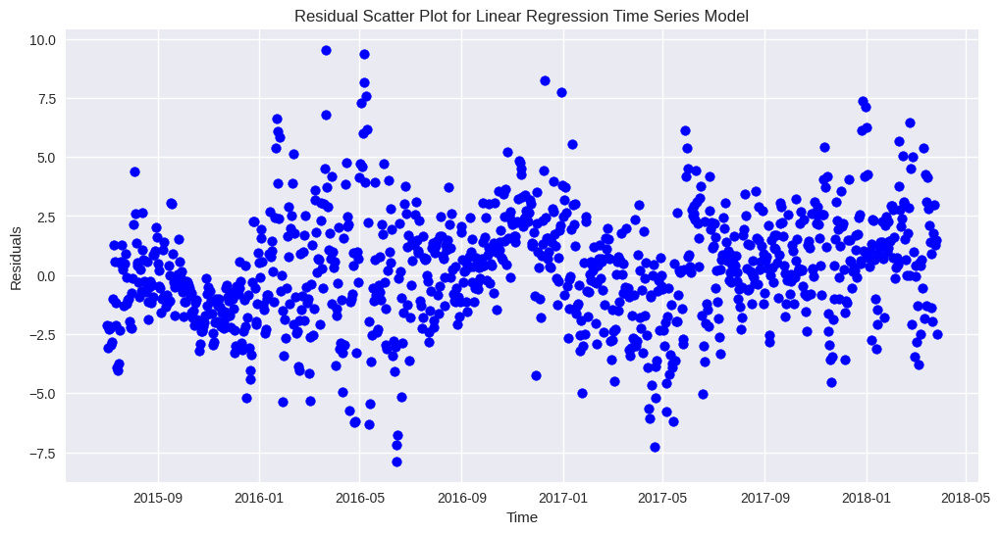

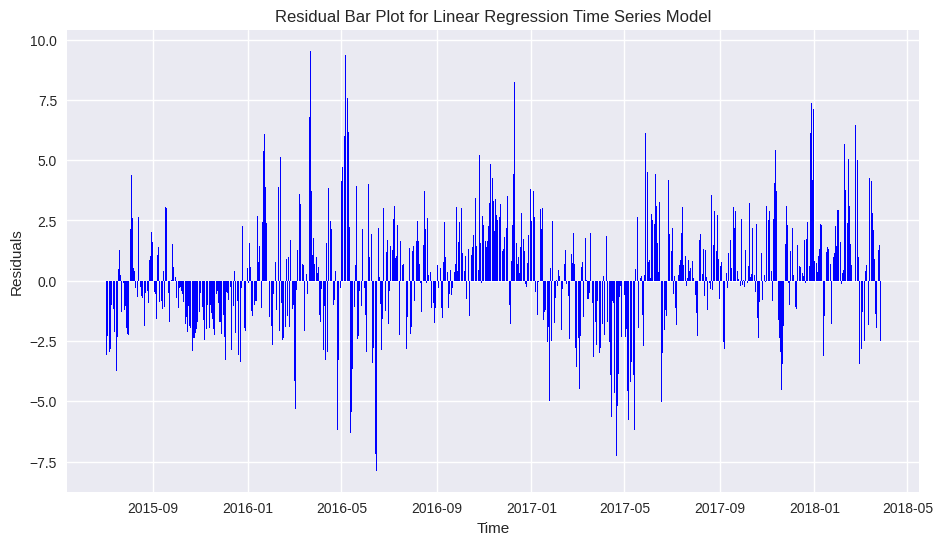

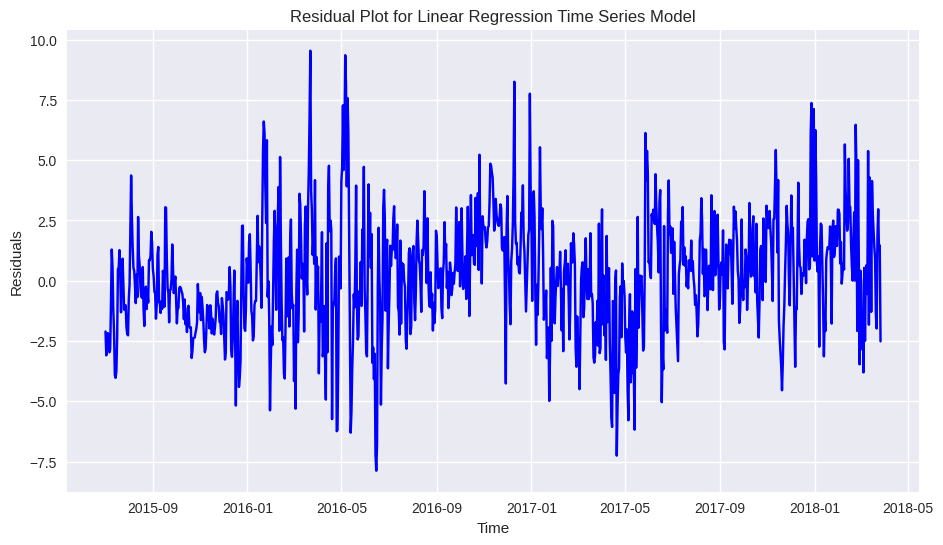

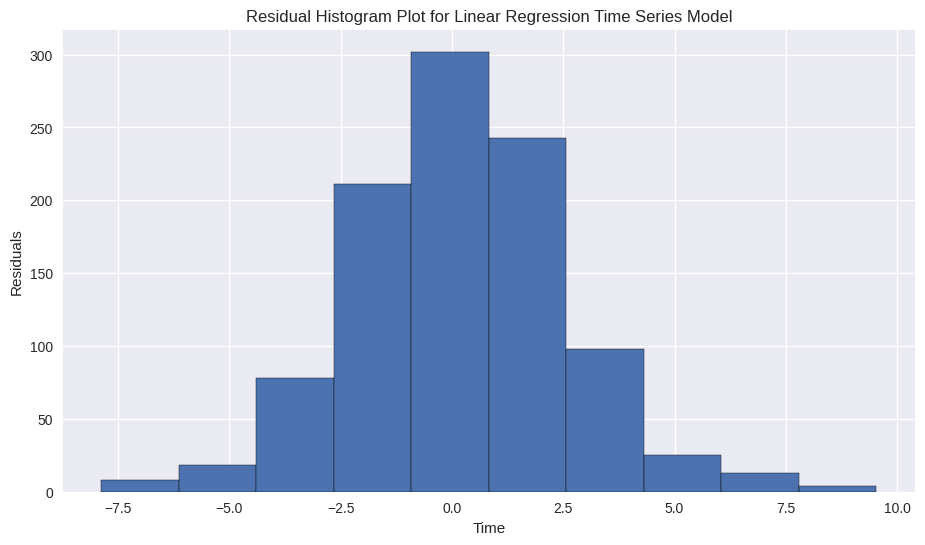

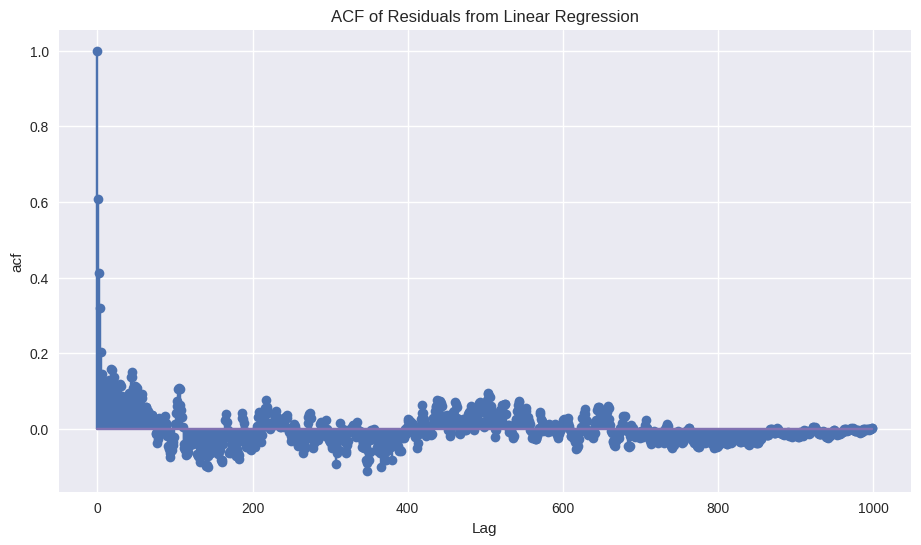

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import acf

model = sm.OLS(lin_pred, y_test).fit()
print(len(df1.index))

residuals = model.resid
print(len(residuals))

lags = len(residuals)-1
acf_values = acf(residuals, nlags=lags)


plt.figure(figsize=(12, 6))
plt.scatter(df1.index[-1000:], residuals, marker='o', color='b')
plt.xlabel('Time')
plt.ylabel('Residuals')
plt.title('Residual Scatter Plot for Linear Regression Time Series Model')
plt.show()
plt.bar(df1.index[-1000:], residuals,  color='b')
plt.xlabel('Time')
plt.ylabel('Residuals')
plt.title('Residual Bar Plot for Linear Regression Time Series Model')
plt.show()
plt.plot(df1.index[-1000:], residuals,  color='b')
plt.xlabel('Time')
plt.ylabel('Residuals')
plt.title('Residual Plot for Linear Regression Time Series Model')
plt.show()
plt.hist(residuals,  edgecolor='black')
plt.xlabel('Time')
plt.ylabel('Residuals')
plt.title('Residual Histogram Plot for Linear Regression Time Series Model')
plt.show()
plt.stem(range(lags + 1), acf_values)
plt.xlabel('Lag')
plt.ylabel('acf')
plt.title('ACF of Residuals from Linear Regression')
plt.grid(True)
plt.show()

# Exponential smoothing

In [ ]:
train=df1[:-1000]
test1=df1[-1000:]

In [ ]:
test=[]
for i in range (len(test1)):
  test.append(test1["Mean_temp"][i])
print(test)

[29.374999999999996, 29.875000000000007, 29.937499999999996, 29.950000000000003, 29.57499999999999, 30.1, 30.687500000000004, 28.3125, 26.275, 26.925000000000004, 28.812500000000004, 29.275, 30.75000000000001, 30.5, 30.224999999999994, 29.425, 26.98749999999999, 26.425000000000004, 26.09999999999999, 27.225, 27.875000000000004, 26.0, 25.425000000000004, 26.175, 27.02500000000001, 26.8, 26.83750000000001, 27.843750000000007, 27.175, 27.4125, 27.67499999999999, 27.35, 25.525000000000013, 22.712499999999988, 23.275, 25.35, 27.0375, 27.48750000000001, 28.0375, 27.825000000000003, 27.124999999999996, 27.537499999999994, 24.950000000000003, 26.9, 27.5625, 28.1875, 28.5875, 28.575, 26.9, 27.9625, 28.25, 27.2, 26.950000000000003, 27.8625, 27.575000000000003, 28.200000000000003, 26.16250000000001, 26.05, 26.77500000000001, 26.325000000000006, 26.375, 27.77500000000001, 27.487500000000008, 28.437500000000007, 28.0125, 28.78750000000001, 28.075000000000003, 26.1, 26.05, 27.9, 28.35, 28.875, 28.67

In [ ]:
from statsmodels.tsa.stattools import adfuller, kpss

def determine_seasonality_type(data, alpha=0.05):
    adf_pvalue = adfuller(data)[1]
    kpss_pvalue = kpss(data)[1]

    if adf_pvalue < alpha and kpss_pvalue > alpha:
        return "Additive Seasonality"
    elif adf_pvalue > alpha and kpss_pvalue < alpha:
        return "Multiplicative Seasonality"
    else:
        return "Unable to Determine"

time_series_data = df1['Mean_temp']
seasonality_type = determine_seasonality_type(time_series_data)

print(f"Detected Seasonality Type: {seasonality_type}")

Detected Seasonality Type: Additive Seasonality


<ipython-input-63-03656eeeaad0>:5: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_pvalue = kpss(data)[1]


In [ ]:
def determine_trend_type(data, alpha=0.05):
    adf_pvalue = adfuller(data)[1]
    kpss_pvalue = kpss(data, regression='ct')[1]

    if adf_pvalue < alpha and kpss_pvalue > alpha:
        return "Additive Trend"
    elif adf_pvalue > alpha and kpss_pvalue < alpha:
        return "Multiplicative Trend"
    else:
        return "Unable to Determine"

time_series_data = df1['Mean_temp']
trend_type = determine_trend_type(time_series_data)

print(f"Detected Trend Type: {trend_type}")

Detected Trend Type: Additive Trend


<ipython-input-64-0d0472b4963c>:3: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_pvalue = kpss(data, regression='ct')[1]


In [ ]:
hwmodel=ExponentialSmoothing(train.Mean_temp,trend='add', seasonal='add', seasonal_periods=365).fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [ ]:

alpha = hwmodel.params['smoothing_level']
beta = hwmodel.params['smoothing_trend']
gamma = hwmodel.params['smoothing_seasonal']

print(f"Alpha (α): {alpha}")
print(f"Beta (β): {beta}")
print(f"Gamma (γ): {gamma}")

Alpha (α): 0.8765916826892687
Beta (β): 1.1023307011920338e-05
Gamma (γ): 0.00015767885059931428


In [ ]:
test_pred1=hwmodel.forecast(1000)


In [ ]:
test_pred1

2015-07-02    27.036839
2015-07-03    27.099120
2015-07-04    27.395967
2015-07-05    27.036782
2015-07-06    26.862022
                ...    
2018-03-23    30.884960
2018-03-24    31.052736
2018-03-25    31.114884
2018-03-26    31.578668
2018-03-27    31.899668
Freq: D, Length: 1000, dtype: float64

In [ ]:
print(test_pred1[49])

26.697320098276393


In [ ]:
print(len(test_pred1))

1000


In [ ]:
test_pred=[]
for i in range (len(test_pred1)):
  test_pred.append(test_pred1[i])
print(test_pred)

[27.036839421129756, 27.0991204831978, 27.395967386789668, 27.036781624730914, 26.86202190700512, 26.92236256454093, 27.32524024682847, 27.10456186591932, 27.349863896101933, 27.3592864418567, 27.41318607244588, 27.04790212133599, 26.5950524047357, 26.352631715510473, 26.377691888750597, 26.822063964817822, 26.914135159917265, 26.672337431732355, 26.4104336819975, 26.03403727491989, 26.177603452784172, 26.455345346553717, 26.192554137385304, 26.118598773655595, 26.238436365860494, 26.38002998569194, 26.609501240119773, 26.294094414807375, 26.16106294468193, 26.032947979453883, 26.76665644639138, 26.537649108399197, 26.420962714739876, 26.039275906116284, 25.956907703653226, 26.187996613386186, 26.501449705037228, 26.59673115957959, 26.471881010997155, 26.564913992090286, 26.667533049067757, 26.462683282542457, 26.766562184535577, 26.86388036392181, 26.823770172492537, 26.6889912222926, 26.09897016941011, 26.465720844177735, 26.153087081974114, 26.697320098276393, 26.46435365446277, 26.

<Axes: xlabel='Dates'>

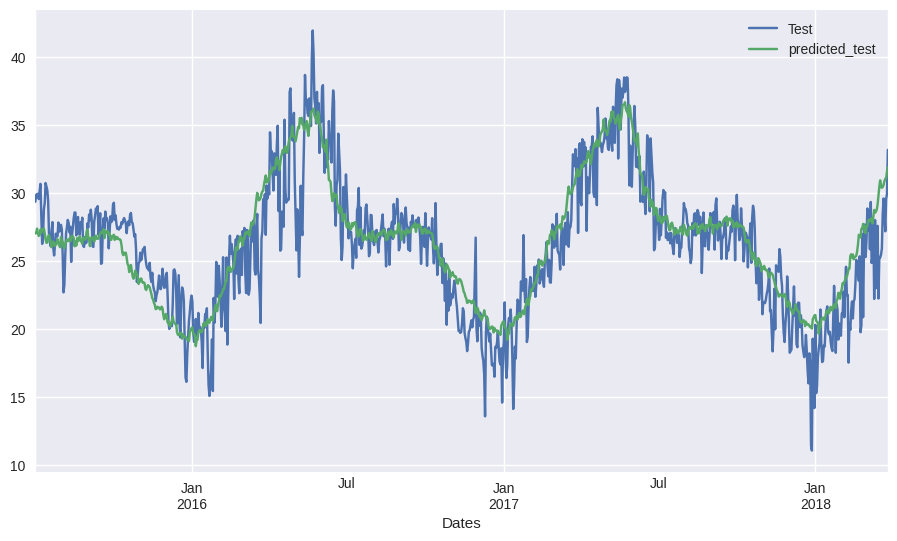

In [ ]:
#train['Mean_temp'].plot(legend=True, label='Train', figsize=(10,6))
test1['Mean_temp'].plot(legend=True, label='Test')

test_pred1.plot(legend=True, label='predicted_test')

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


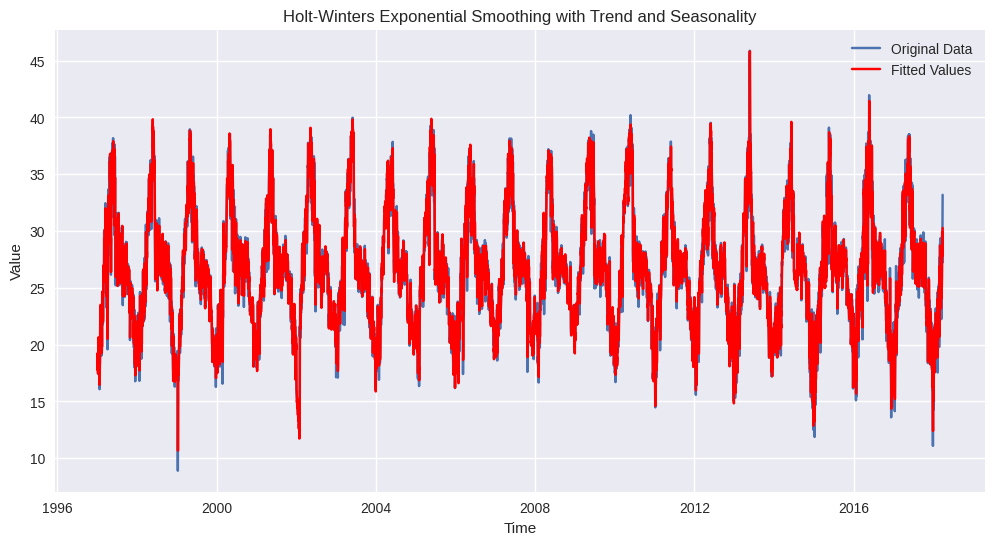

In [ ]:
model = ExponentialSmoothing(df1['Mean_temp'],seasonal='add', seasonal_periods=365, trend='add')
model_fit = model.fit()
fitted_values = model_fit.fittedvalues


plt.figure(figsize=(12, 6))
plt.plot(df1['Mean_temp'], label='Original Data')
plt.plot(fitted_values, label='Fitted Values', color='red')
plt.legend()
plt.xlabel('Time')
plt.ylabel('Value')
plt.title('Holt-Winters Exponential Smoothing with Trend and Seasonality')
plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error
import numpy as np

In [ ]:
print(test)
print(len(test))
print(test_pred)
print(len(test_pred))

[29.374999999999996, 29.875000000000007, 29.937499999999996, 29.950000000000003, 29.57499999999999, 30.1, 30.687500000000004, 28.3125, 26.275, 26.925000000000004, 28.812500000000004, 29.275, 30.75000000000001, 30.5, 30.224999999999994, 29.425, 26.98749999999999, 26.425000000000004, 26.09999999999999, 27.225, 27.875000000000004, 26.0, 25.425000000000004, 26.175, 27.02500000000001, 26.8, 26.83750000000001, 27.843750000000007, 27.175, 27.4125, 27.67499999999999, 27.35, 25.525000000000013, 22.712499999999988, 23.275, 25.35, 27.0375, 27.48750000000001, 28.0375, 27.825000000000003, 27.124999999999996, 27.537499999999994, 24.950000000000003, 26.9, 27.5625, 28.1875, 28.5875, 28.575, 26.9, 27.9625, 28.25, 27.2, 26.950000000000003, 27.8625, 27.575000000000003, 28.200000000000003, 26.16250000000001, 26.05, 26.77500000000001, 26.325000000000006, 26.375, 27.77500000000001, 27.487500000000008, 28.437500000000007, 28.0125, 28.78750000000001, 28.075000000000003, 26.1, 26.05, 27.9, 28.35, 28.875, 28.67

In [ ]:
import pandas as pd


data = {
    'observed': test,
    'exp_predicted': test_pred
}

df = pd.DataFrame(data)
print(df)
df.to_csv("test_output_exp.csv")

      observed  exp_predicted
0    29.375000      27.036839
1    29.875000      27.099120
2    29.937500      27.395967
3    29.950000      27.036782
4    29.575000      26.862022
..         ...            ...
995  28.606250      30.884960
996  27.200000      31.052736
997  29.575000      31.114884
998  29.950000      31.578668
999  33.185417      31.899668

[1000 rows x 2 columns]


In [ ]:
pd.read_csv("/content/test_output_exp.csv")

,Unnamed: 0,observed,exp_predicted
0,0,29.375000,27.036839
1,1,29.875000,27.099120
2,2,29.937500,27.395967
3,3,29.950000,27.036782
4,4,29.575000,26.862022
...,...,...,...
995,995,28.606250,30.884960
996,996,27.200000,31.052736
997,997,29.575000,31.114884
998,998,29.950000,31.578668


In [ ]:
np.sqrt(mean_squared_error(test,test_pred))

2.4060512578255455

In [ ]:
df1.Mean_temp.mean(), np.sqrt(df1.Mean_temp.var())

(26.632923219887413, 5.030206498160421)

In [ ]:
final_model=ExponentialSmoothing(df1.Mean_temp,trend='add', seasonal='add', seasonal_periods=365).fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:917: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [ ]:
pred=final_model.forecast(365)


In [ ]:

pred

2018-03-28    32.820762
2018-03-29    32.281577
2018-03-30    32.771214
2018-03-31    32.649254
2018-04-01    32.795202
                ...    
2019-03-23    31.577189
2019-03-24    31.668030
2019-03-25    31.919384
2019-03-26    32.397169
2019-03-27    32.762078
Freq: D, Length: 365, dtype: float64

<Axes: xlabel='Dates'>

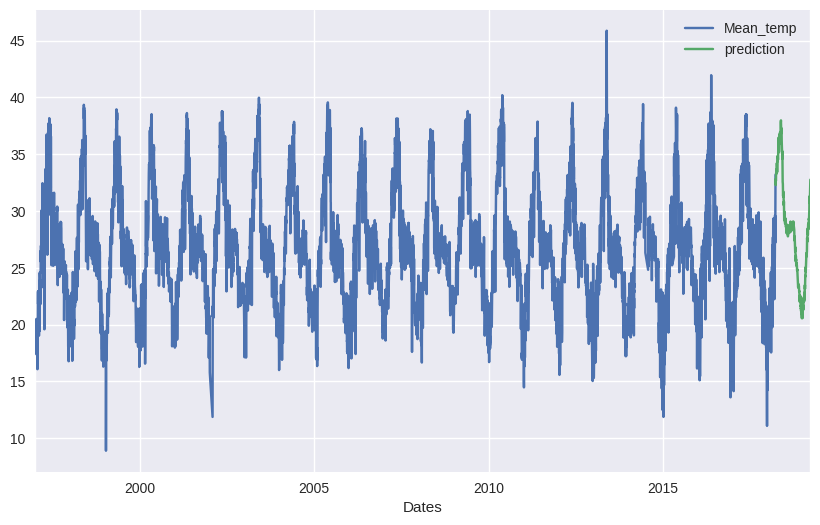

In [ ]:
df1['Mean_temp'].plot(legend=True, label='Mean_temp', figsize=(10,6))
pred.plot(legend=True, label='prediction')

In [ ]:
print(test_pred1.tolist())

[27.036839421129756, 27.0991204831978, 27.395967386789668, 27.036781624730914, 26.86202190700512, 26.92236256454093, 27.32524024682847, 27.10456186591932, 27.349863896101933, 27.3592864418567, 27.41318607244588, 27.04790212133599, 26.5950524047357, 26.352631715510473, 26.377691888750597, 26.822063964817822, 26.914135159917265, 26.672337431732355, 26.4104336819975, 26.03403727491989, 26.177603452784172, 26.455345346553717, 26.192554137385304, 26.118598773655595, 26.238436365860494, 26.38002998569194, 26.609501240119773, 26.294094414807375, 26.16106294468193, 26.032947979453883, 26.76665644639138, 26.537649108399197, 26.420962714739876, 26.039275906116284, 25.956907703653226, 26.187996613386186, 26.501449705037228, 26.59673115957959, 26.471881010997155, 26.564913992090286, 26.667533049067757, 26.462683282542457, 26.766562184535577, 26.86388036392181, 26.823770172492537, 26.6889912222926, 26.09897016941011, 26.465720844177735, 26.153087081974114, 26.697320098276393, 26.46435365446277, 26.

In [ ]:
test=test1["Mean_temp"].tolist()
test_pred=test_pred1.tolist()

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from math import sqrt
from sklearn.metrics import r2_score

rmse_lr=sqrt(mean_squared_error(test,test_pred))
mse=mean_squared_error(test,test_pred)
r_squared = r2_score(test,test_pred)
mae = mean_absolute_error(test,test_pred)
mape = mean_absolute_percentage_error(test,test_pred)

print(f"R-squared value:",r_squared)
print("MSE:",mse)
print("MAE:",mae)
print('RMSE:',rmse_lr)
print("MAPE:",mape)

R-squared value: 0.7537409990865956
MSE: 5.789082655283889
MAE: 1.8233170219214034
RMSE: 2.4060512578255455
MAPE: 0.07546794224725412


In [ ]:
k=[]
for i in range (len(test)):
  if test[i]>mean_temp and test_pred[i]>mean_temp:
    k.append(i)
i_1=len(k)
#print(k)

j=[]
for i in range (len(test)):
  if test[i]<mean_temp and test_pred[i]<mean_temp:
    j.append(i)
i_4=len(j)

l=[]
for i in range (len(test)):
  if test[i]<mean_temp and test_pred[i]>mean_temp:
    l.append(i)
i_3=len(l)


m=[]
for i in range (len(test)):
  if test[i]>mean_temp and test_pred[i]<mean_temp:
    m.append(i)
i_2=len(m)

In [ ]:
#contingency table
from tabulate import tabulate

headers = ["Data/Forecst", "Above", "Below"]
data = [["Above", i_1,i_2 ],
        ["Below", i_3, i_4]]

table = tabulate(data, headers, tablefmt="fancy_grid")

print(table)
print(i_1+i_2+i_3+i_4)

╒════════════════╤═════════╤═════════╕
│ Data/Forecst   │   Above │   Below │
╞════════════════╪═════════╪═════════╡
│ Above          │     412 │      73 │
├────────────────┼─────────┼─────────┤
│ Below          │     124 │     391 │
╘════════════════╧═════════╧═════════╛
1000


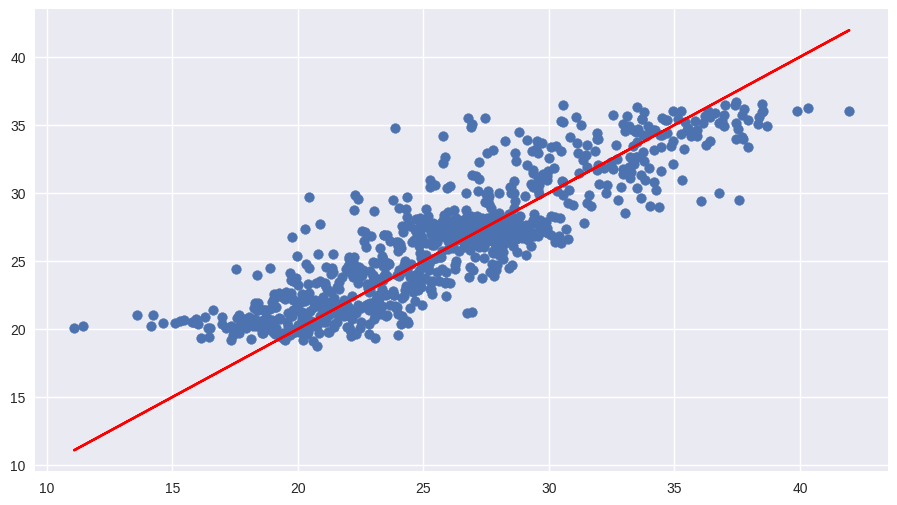

In [ ]:
plt.scatter(test, test_pred)
plt.plot(test,test,color="r")

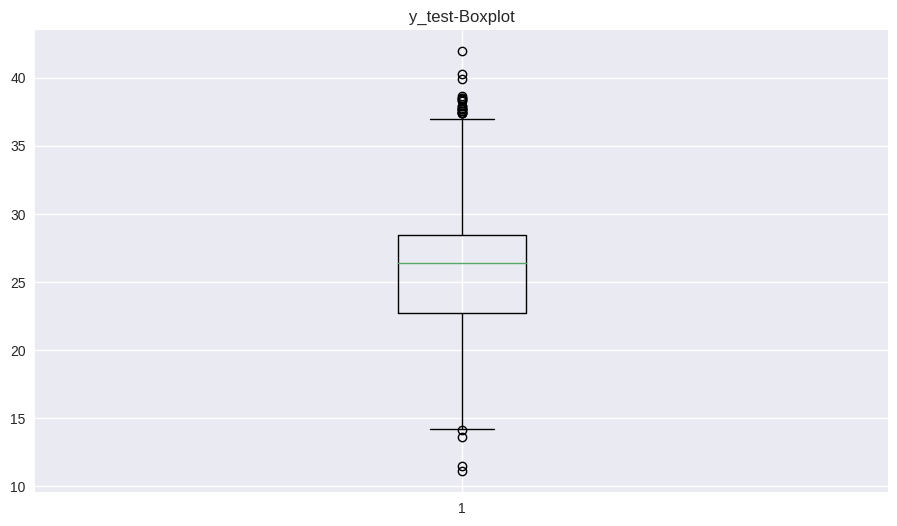

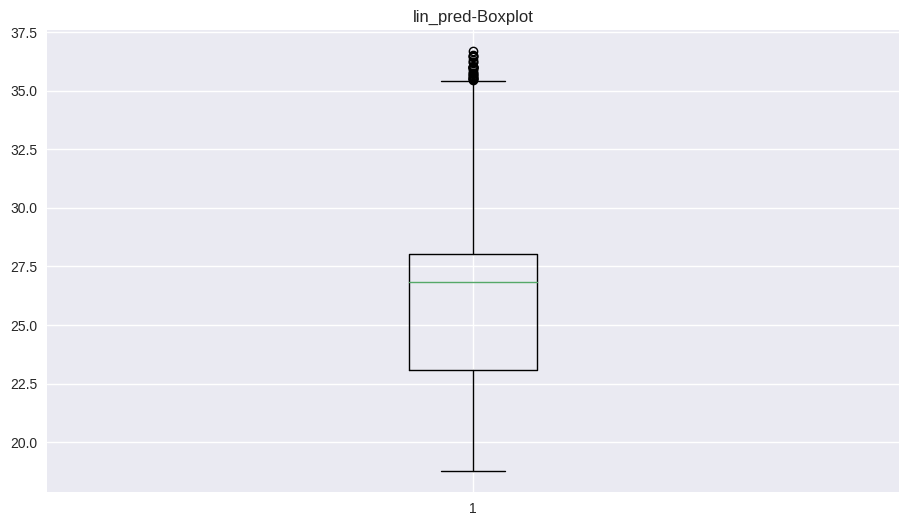

y_test,lin_pred
median 26.43020833333334 26.822990007262998
25_parcentile 22.74375 23.09775873090261
75_parcentile 28.470312500000002 28.040435322544564


In [ ]:
import matplotlib.pyplot as plt

plt.boxplot(test)
plt.title("y_test-Boxplot")
plt.show()

plt.boxplot(test_pred)
plt.title("lin_pred-Boxplot")
plt.show()

print("y_test,lin_pred")
print("median",np.median(test), np.median(test_pred))
print("25_parcentile",np.percentile(test,25), np.percentile(test_pred,25))
print("75_parcentile",np.percentile(test,75), np.percentile(test_pred,75))

Only with trend component

In [ ]:
hwmodel=ExponentialSmoothing(train.Mean_temp,trend='add', seasonal_periods=365).fit()

In [ ]:
test_pred=hwmodel.forecast(3082)

In [ ]:
test_pred

2015-07-02    27.356839
2015-07-03    27.358661
2015-07-04    27.360483
2015-07-05    27.362305
2015-07-06    27.364127
                ...    
2023-12-04    32.963147
2023-12-05    32.964969
2023-12-06    32.966791
2023-12-07    32.968613
2023-12-08    32.970435
Freq: D, Length: 3082, dtype: float64

<Axes: xlabel='Dates'>

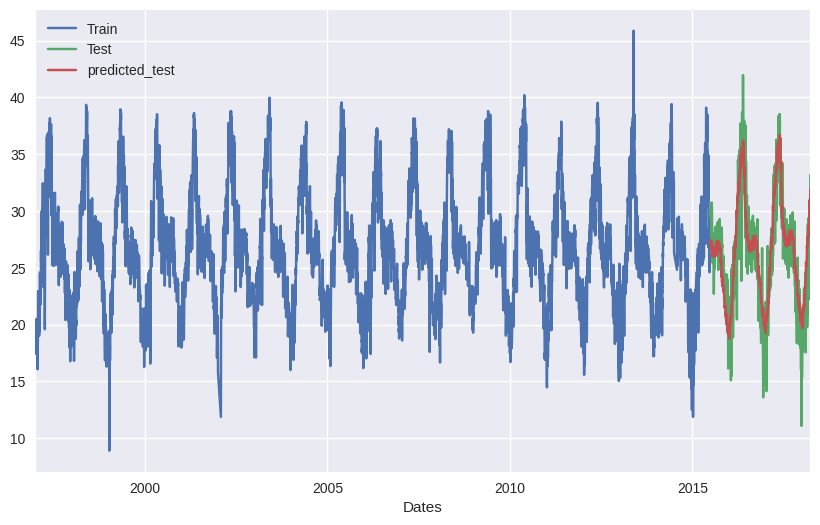

In [ ]:
train['Mean_temp'].plot(legend=True, label='Train', figsize=(10,6))
test1['Mean_temp'].plot(legend=True, label='Test')

test_pred1.plot(legend=True, label='predicted_test')

ARIMA

In [ ]:
from statsmodels.tsa.stattools import adfuller
def adf_test(dataset):
     dftest = adfuller(dataset, autolag = 'AIC')
     print("1. ADF : ",dftest[0])
     print("2. P-Value : ", dftest[1])
     print("3. Num Of Lags : ", dftest[2])
     print("4. Num Of Observations Used For ADF Regression:",      dftest[3])
     print("5. Critical Values :")
     for key, val in dftest[4].items():
         print("\t",key, ": ", val)
adf_test(df1['Mean_temp'])

1. ADF :  -7.982153482833772
2. P-Value :  2.6060105916036637e-12
3. Num Of Lags :  35
4. Num Of Observations Used For ADF Regression: 7721
5. Critical Values :
	 1% :  -3.4311972316284387
	 5% :  -2.861914413812488
	 10% :  -2.5669692959218984


In [ ]:
pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 20.4 MB/s eta 0:00:00


In [ ]:
from pmdarima import auto_arima
'''stepwise_fit = auto_arima(df1['Mean_temp'], trace=True,
suppress_warnings=True)'''

"stepwise_fit = auto_arima(df1['Mean_temp'], trace=True,\nsuppress_warnings=True)"

In [ ]:
print(df1.shape)
train=df1[:-1000]
test=df1[-1000:]
print(train.shape,test.shape)

(7757, 4)
(6757, 4) (1000, 4)


In [ ]:
from statsmodels.tsa.arima.model import ARIMA
model=ARIMA(train['Mean_temp'],order=(4,0,2))
model=model.fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:              Mean_temp   No. Observations:                 6757
Model:                 ARIMA(4, 0, 2)   Log Likelihood              -11363.023
Date:                Wed, 15 Nov 2023   AIC                          22742.046
Time:                        12:03:21   BIC                          22796.593
Sample:                    12-31-1996   HQIC                         22760.876
                         - 07-01-2015                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         26.6919      0.829     32.194      0.000      25.067      28.317
ar.L1          1.2514      0.247      5.070      0.000       0.768       1.735
ar.L2         -0.0960      0.414     -0.232      0.817      -0.908       0.716
ar.L3         -0.2265      0.182     -1.247      0.213      -0.582       0.130
ar.L4          0.0642      0.017      3.715      0.000       0.030       0.098
ma.L1         -0.3824      0.247     -1.545      0.122      -0.867       0.103
ma.L2         -0.2617      0.202     -1.296      0.195      -0.657       0.134
sigma2         1.6905      0.019     86.811      0.000       1.652       1.729
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              2372.06
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               0.96   Skew:                            -0.35
Prob(H) (two-sided):                  0.36   Kurtosis:                         5.82
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

<Axes: xlabel='Dates'>

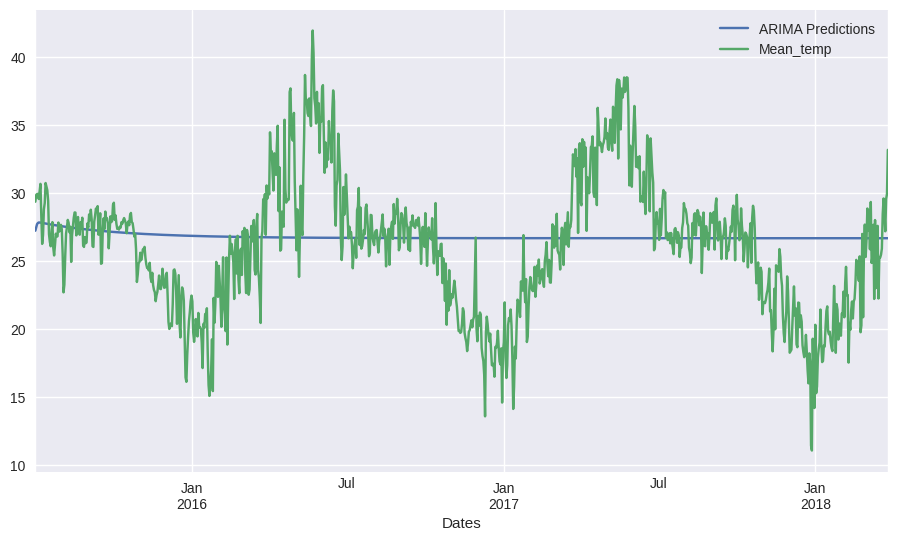

In [ ]:
pred=model.forecast(1000).rename('ARIMA Predictions')
pred.plot(legend=True)
test['Mean_temp'].plot(legend=True)

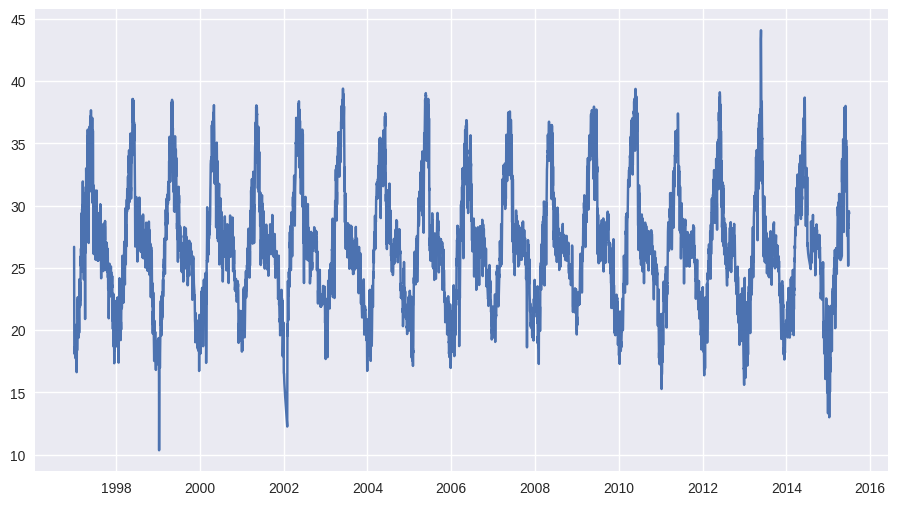

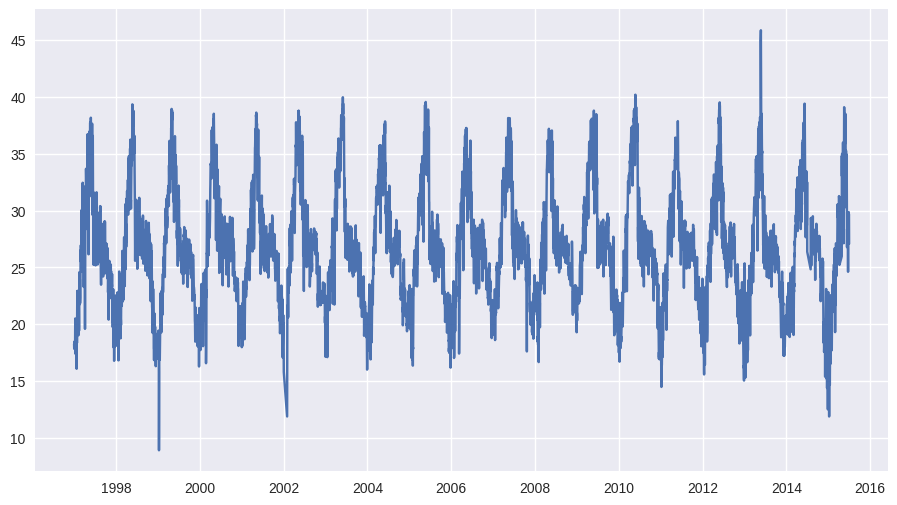

In [ ]:
fitted_values = model.fittedvalues
plt.plot(fitted_values)
plt.show()
plt.plot(train["Mean_temp"])

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt
test['Mean_temp'].mean()
rmse=sqrt(mean_squared_error(pred,test['Mean_temp']))
print(rmse)

4.897538030180892


In [ ]:
pred

2015-07-02    27.243704
2015-07-03    27.477360
2015-07-04    27.725122
2015-07-05    27.809143
2015-07-06    27.848427
                ...    
2018-03-23    26.691925
2018-03-24    26.691925
2018-03-25    26.691925
2018-03-26    26.691924
2018-03-27    26.691924
Freq: D, Name: ARIMA Predictions, Length: 1000, dtype: float64

In [ ]:
print(max(pred))
print(min(pred))

27.848427247412946
26.69192396730842


In [ ]:
pip install utilsforecast

In [ ]:
import pandas as pd
from utilsforecast.plotting import plot_series

In [ ]:
data = pd.DataFrame({
    'unique_id': ['H1'] * len(df1["Mean_temp"]),  # Set 'unique_id' to 'H1' for all rows
    'ds': range(len(df1["Mean_temp"])),  # Use the index as the 'ds' (date/time) column
    'y': df1["Mean_temp"].values  # Your target variable
})
data

,unique_id,ds,y
0,H1,0,18.250000
1,H1,1,17.850000
2,H1,2,18.300000
3,H1,3,18.175000
4,H1,4,18.475000
...,...,...,...
7752,H1,7752,28.606250
7753,H1,7753,27.200000
7754,H1,7754,29.575000
7755,H1,7755,29.950000


In [ ]:
train=data[:-1000]
test=data[-1000:]

In [ ]:
train

,unique_id,ds,y
0,H1,0,18.2500
1,H1,1,17.8500
2,H1,2,18.3000
3,H1,3,18.1750
4,H1,4,18.4750
...,...,...,...
6752,H1,6752,29.1250
6753,H1,6753,29.8625
6754,H1,6754,29.6250
6755,H1,6755,29.6500


In [ ]:
test

,unique_id,ds,y
6757,H1,6757,29.375000
6758,H1,6758,29.875000
6759,H1,6759,29.937500
6760,H1,6760,29.950000
6761,H1,6761,29.575000
...,...,...,...
7752,H1,7752,28.606250
7753,H1,7753,27.200000
7754,H1,7754,29.575000
7755,H1,7755,29.950000


In [ ]:
n_series = 8
uids = train['unique_id'].unique()[:n_series]
print(uids)

['H1']


In [ ]:
train = train.query('unique_id in @uids')
test = test.query('unique_id in @uids')

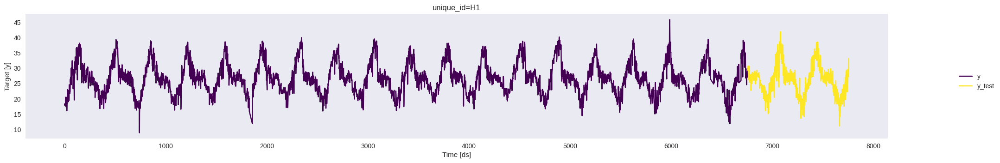

In [ ]:
plot_series(train, test.rename(columns={'y': 'y_test'}), models=['y_test'], plot_random=False)

In [ ]:
pip install mlforecast

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.2/54.2 kB 1.6 MB/s eta 0:00:00


In [ ]:
from mlforecast import MLForecast
from mlforecast.target_transforms import Differences
from mlforecast.utils import PredictionIntervals
from sklearn.linear_model import Lasso, LinearRegression, Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor

In [ ]:
# Create a list of models and instantiation parameters
models = [
    KNeighborsRegressor(),
    Lasso(),
    LinearRegression(),
    MLPRegressor(),
    Ridge(),
]

In [ ]:
#daily_lags = [1, 7,30]

'''mlf = MLForecast(
    models=[Ridge(), Lasso(), LinearRegression(), KNeighborsRegressor(), MLPRegressor(random_state=0)],
    freq=1,
    target_transforms=[Differences([1])],
    lags=[365*(l+1) for l in range(20)],  \
)'''

'mlf = MLForecast(\n    models=[Ridge(), Lasso(), LinearRegression(), KNeighborsRegressor(), MLPRegressor(random_state=0)],\n    freq=1,\n    target_transforms=[Differences([1])],\n    lags=[365*(l+1) for l in range(20)],  )'

In [ ]:
annual_seasonal_lags=[]
for i in range(5):
  annual_seasonal_lags.append(365*(i+1))
print(annual_seasonal_lags)

[365, 730, 1095, 1460, 1825]


In [ ]:
#annual_seasonal_lags = [365, 2*365, 3*365, 4*365, 5*365, 6*365, 7*365]

mlf = MLForecast(
    models=[Ridge(), Lasso(), LinearRegression(), KNeighborsRegressor(), MLPRegressor(random_state=0)],
    freq=365,
    target_transforms=[Differences([1])],
    lags=annual_seasonal_lags
)

In [ ]:
train["y"]

0       18.2500
1       17.8500
2       18.3000
3       18.1750
4       18.4750
         ...   
6752    29.1250
6753    29.8625
6754    29.6250
6755    29.6500
6756    27.0750
Name: y, Length: 6757, dtype: float64

In [ ]:

print(train.shape)


(6757, 3)


In [ ]:
mlf.fit(
    train,
    prediction_intervals=PredictionIntervals(n_windows=4, h=1000),
)

ValueError: ignored

In [ ]:
levels = [50, 80, 95]
forecasts = mlf.predict(1000,level=levels)


In [ ]:
forecasts.tail(20)

In [ ]:
forecasts.to_csv("probabilistic_forecast1.csv")

In [ ]:
test = test.merge(forecasts, how='left', on=['unique_id', 'ds'])

In [ ]:
#KNeighbour regression
fig = plot_series(
    train,
    test,
    plot_random=False,
    models=['KNeighborsRegressor'],
    level=levels

)
fig

In [ ]:
#lasso
plot_series(
    train,
    test,
    plot_random=False,
    models=['Lasso'],
    level=levels
)

In [ ]:
#lin_reg
plot_series(
    train,
    test,
    plot_random=False,
    models=['LinearRegression'],
    level=levels
)

In [ ]:
#ridge
plot_series(
    train,
    test,
    plot_random=False,
    models=['Ridge'],
    level=levels
)